<a href="https://colab.research.google.com/github/NadyaPutriAmalia/PCVK_Ganjil_2023/blob/main/UAS_PCVK_Lengkap_Sama_Machine_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Kelompok 10**
#**Kelas TI-3C**
**Ibnu Hajar Askholani<br>
Nadya Putri Amalia <br>
Zaky Muhammad Ibrahim <br>**

# PCVK OCR
## - Buat Model
## - Preproses
## - Deteksi Karakter (OCR)


In [ ]:
import pandas as pd
import zipfile, imutils
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.callbacks import ModelCheckpoint
import joblib
from sklearn.metrics import classification_report
from imutils.contours import sort_contours
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Prepare Dataset

## alphabet

In [ ]:
!mkdir -p /root/.kaggle/
!mv kaggle.json /root/.kaggle/

mv: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!pip install kaggle

In [ ]:
# !kaggle datasets download -d thomasqazwsxedc/alphabet-characters-fonts-dataset
!kaggle datasets download -d sachinpatel21/az-handwritten-alphabets-in-csv-format
# !kaggle datasets download -d swarupshah/digit-character

 92% 170M/185M [00:01<00:00, 169MB/s]
100% 185M/185M [00:01<00:00, 148MB/s]


In [ ]:
with zipfile.ZipFile('/content/az-handwritten-alphabets-in-csv-format.zip', 'r') as zip_ref:
    zip_ref.extractall('dataset')

In [ ]:
dataset_az = pd.read_csv('/content/dataset/A_Z Handwritten Data/A_Z Handwritten Data.csv').astype('float32')
dataset_az

,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,...,0.639,0.640,0.641,0.642,0.643,0.644,0.645,0.646,0.647,0.648
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372445,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372446,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372447,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372448,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Get pixel data only
alphabet_data = dataset_az.drop('0', axis=1)
# Get labels only
alphabet_labels = dataset_az['0']

alphabet_data.shape, alphabet_labels.shape

((372450, 784), (372450,))

In [ ]:
# Reshape pixel data to 28*28
alphabet_data = np.reshape(alphabet_data.values, (alphabet_data.shape[0], 28, 28))
# Check the result by its shape
alphabet_data.shape

(372450, 28, 28)

Text(0.5, 1.0, 'Class: 18.0')

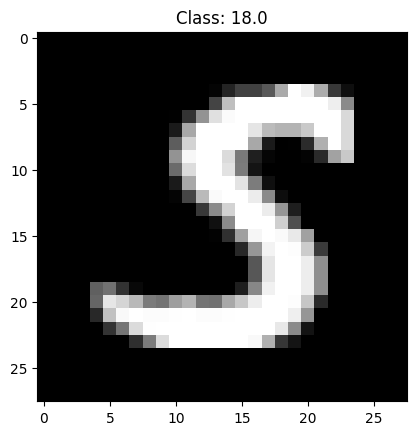

In [ ]:
# Randomly checking A-Z dataset
index = np.random.randint(0, alphabet_data.shape[0])
plt.imshow(alphabet_data[index], cmap = 'gray')
plt.title('Class: ' + str(alphabet_labels[index]))

## mnist

In [ ]:
from tensorflow.keras.datasets import mnist
(train_data, train_labels), (test_data, test_labels) = mnist.load_data()

digits_data = np.vstack([train_data, test_data])
digits_labels = np.hstack([train_labels, test_labels])

11490434/11490434 [==============================] - 0s 0us/step


In [ ]:
digits_data.shape

(70000, 28, 28)

Text(0.5, 1.0, 'Class: 7')

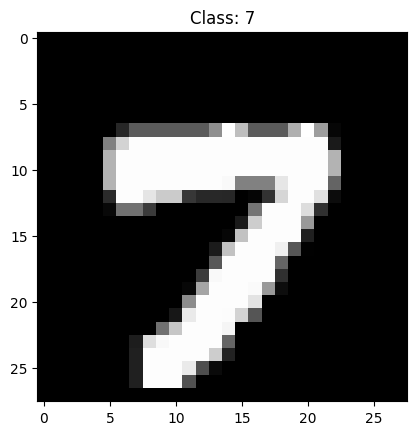

In [ ]:
# Randomly checking the data
idx = np.random.randint(0, digits_data.shape[0])
plt.imshow(digits_data[idx], cmap='gray')
plt.title('Class: ' + str(digits_labels[idx]))

## Combine Datasets (AZ and Mnist)

In [ ]:
# Check unique value from digits_labels
np.unique(digits_labels)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

In [ ]:
# Check unique value from alphabet_labels
np.unique(alphabet_labels)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.],
      dtype=float32)

In [ ]:
# We already know that digits labels containt labels from 0-9 (10 labels)
# We also know that alphabet labels start from 0-25 which represent A-Z
# If we want to combine them, the A-Z labels should continuing the digits label

alphabet_labels += 10
np.unique(alphabet_labels)

array([10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22.,
       23., 24., 25., 26., 27., 28., 29., 30., 31., 32., 33., 34., 35.],
      dtype=float32)

In [ ]:
# Combine
data = np.vstack([alphabet_data, digits_data])
labels = np.hstack([alphabet_labels, digits_labels])

# Check the shape
data.shape, labels.shape

((442450, 28, 28), (442450,))

In [ ]:
# Check labels
np.unique(labels)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35.], dtype=float32)

In [ ]:
# Convert data to float32
data = np.array(data, dtype = 'float32')

In [ ]:
# Since Convolutional need 3d data (including depth)
# and our images only in 2d data (because in grayscale format)
# we need to add "the depth" to the data
data = np.expand_dims(data, axis=-1)

# check shape
data.shape

(442450, 28, 28, 1)

# Main Code

## Model

In [ ]:
# Normalize data
data /= 255.0

# Enconde the labels
le = LabelBinarizer()
labels = le.fit_transform(labels)

Text(0.5, 1.0, '[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]')

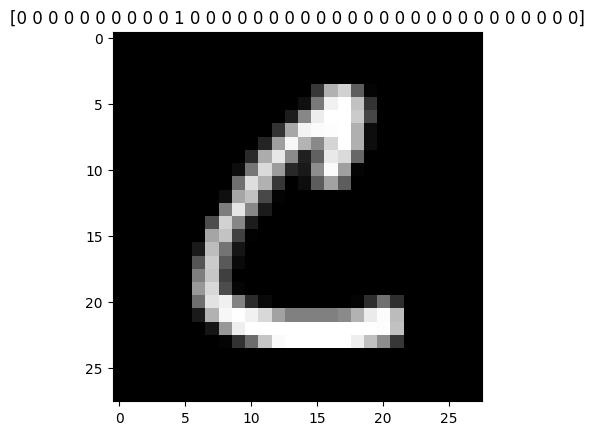

In [ ]:
# Check data with label binarizer's label
plt.imshow(data[30000].reshape(28,28), cmap='gray')
plt.title(str(labels[0]))

In [ ]:
# Since our data is not balance, we will handle it by giving weight for 'small' data

# Check number of data for each labels first
classes_total = labels.sum(axis = 0)
classes_total

array([ 6903,  7877,  6990,  7141,  6824,  6313,  6876,  7293,  6825,
        6958, 13869,  8668, 23409, 10134, 11440,  1163,  5762,  7218,
        1120,  8493,  5603, 11586, 12336, 19010, 57825, 19341,  5812,
       11566, 48419, 22495, 29008,  4182, 10784,  6272, 10859,  6076])

In [ ]:
# Create a weight for each data
classes_weights = {}
for i in range(0, len(classes_total)):
  #print(i)
  classes_weights[i] = classes_total.max() / classes_total[i]

# Check the weight for each data
classes_weights

{0: 8.376792698826597,
 1: 7.340992763742541,
 2: 8.272532188841202,
 3: 8.097605377398123,
 4: 8.473769050410317,
 5: 9.15967052114684,
 6: 8.409685863874346,
 7: 7.928835870012341,
 8: 8.472527472527473,
 9: 8.310577752227651,
 10: 4.169370538611291,
 11: 6.671089063221043,
 12: 2.4702037677816224,
 13: 5.7060390763765545,
 14: 5.0546328671328675,
 15: 49.72055030094583,
 16: 10.035577924331829,
 17: 8.011221945137157,
 18: 51.629464285714285,
 19: 6.808548216178029,
 20: 10.320364090665715,
 21: 4.990937338166753,
 22: 4.6875,
 23: 3.0418200946870066,
 24: 1.0,
 25: 2.989762680316426,
 26: 9.94924294562973,
 27: 4.999567698426422,
 28: 1.1942625828703608,
 29: 2.5705712380529007,
 30: 1.993415609487038,
 31: 13.827116212338593,
 32: 5.362110534124629,
 33: 9.21954719387755,
 34: 5.3250759738465785,
 35: 9.51695194206715}

In [ ]:
# split data
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size = 0.2, random_state = 1, stratify = labels)

#create data augmentation
augmentation = ImageDataGenerator(rotation_range = 10, zoom_range=0.05, width_shift_range=0.1,
                                  height_shift_range=0.1, horizontal_flip = False)

In [ ]:
model = Sequential()

model.add(Conv2D(filters = 32, kernel_size=(3,3), activation='relu', input_shape=(28,28,1)))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Conv2D(filters = 64, kernel_size=(3,3), activation='relu', padding='same'))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Conv2D(filters = 128, kernel_size=(3,3), activation='relu', padding='valid'))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Flatten())

model.add(Dense(64, activation = 'relu'))
model.add(Dense(128, activation = 'relu'))

# output
model.add(Dense(36, activation='softmax'))

model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

In [ ]:
# Create actual labels
name_labels = '0123456789'
name_labels += 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
name_labels = [l for l in name_labels]

print(name_labels)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [ ]:
joblib.dump(name_labels, "labels.pkl")

['labels.pkl']

In [ ]:
a = joblib.load("labels.pkl")
print(a)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [ ]:
# Set model name, epoch, and batch size
file_model = 'manual_ocr.model'
epochs = 20
batch_size = 128

In [ ]:
# Setup checkpoint
checkpointer = ModelCheckpoint(file_model, monitor = 'val_loss', verbose = 1, save_best_only=True)

# Fit the model
history = model.fit(augmentation.flow(X_train, y_train, batch_size=batch_size),
                      validation_data = (X_test, y_test),
                      steps_per_epoch = len(X_train) // batch_size, epochs=epochs,
                      class_weight = classes_weights, verbose=1, callbacks=[checkpointer])

Epoch 1/20
2034/2765 [=====================>........] - ETA: 2:27 - loss: 2.5838 - accuracy: 0.7995

KeyboardInterrupt: ignored

In [ ]:
# make a prediction
predictions = model.predict(X_test, batch_size=batch_size)

# Check prediction for data-0
# You will get the probability for each label
# The highest one is the prediction
predictions[10]

692/692 [==============================] - 2s 2ms/step


array([1.4432064e-08, 1.3559214e-13, 3.1654295e-08, 1.1773274e-05,
       6.5322948e-13, 4.6305903e-03, 7.4459421e-09, 3.8794336e-14,
       1.8424824e-10, 5.4514373e-08, 3.1638068e-15, 5.7759266e-08,
       8.5145544e-09, 1.8806801e-09, 4.9429790e-14, 9.6874441e-19,
       3.6852762e-06, 5.2372505e-15, 6.1922229e-19, 4.1869935e-05,
       1.6035703e-09, 1.1458446e-10, 1.2514709e-12, 4.9051378e-11,
       4.3126778e-09, 1.7054703e-11, 3.9027809e-11, 2.7761627e-14,
       9.9531186e-01, 2.7643298e-12, 2.7668989e-08, 4.0858042e-12,
       1.3847958e-11, 1.1620059e-21, 3.1162635e-09, 2.1053703e-09],
      dtype=float32)

In [ ]:
# Get the actual prediction -> highest probability
name_labels[np.argmax(predictions[10])]

'S'

In [ ]:
name_labels[np.argmax(predictions[10])]

'S'

In [ ]:
# check prediction
np.argmax(y_test[10]) == np.argmax(predictions[10])

True

In [ ]:
# Evaluate on test data
model.evaluate(X_test, y_test)

2766/2766 [==============================] - 12s 4ms/step - loss: 0.1324 - accuracy: 0.9563


[0.1323622763156891, 0.9563001394271851]

In [ ]:
# Print Classification Report
print(classification_report(y_test.argmax(axis=1), predictions.argmax(axis=1), target_names = name_labels))

              precision    recall  f1-score   support

           0       0.40      0.57      0.47      1381
           1       0.97      0.99      0.98      1575
           2       0.90      0.98      0.94      1398
           3       0.98      0.99      0.99      1428
           4       0.89      0.98      0.93      1365
           5       0.85      0.89      0.87      1263
           6       0.96      0.97      0.96      1375
           7       0.95      0.98      0.97      1459
           8       0.97      0.99      0.98      1365
           9       0.97      0.98      0.98      1392
           A       0.99      0.99      0.99      2774
           B       0.99      0.98      0.99      1734
           C       0.99      0.99      0.99      4682
           D       0.83      0.99      0.90      2027
           E       0.99      0.99      0.99      2288
           F       0.97      1.00      0.98       233
           G       0.96      0.94      0.95      1152
           H       0.98    

In [ ]:
# save the model
model.save('model', save_format= 'h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
save_path="/content/drive/MyDrive/PCVK/ocr_custom"
model.save(save_path)

## PreProceess

In [ ]:
model = load_model('/content/model.h5')
# check summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

In [ ]:
import cv2
import numpy as np
import imutils
from imutils.contours import sort_contours
from google.colab.patches import cv2_imshow

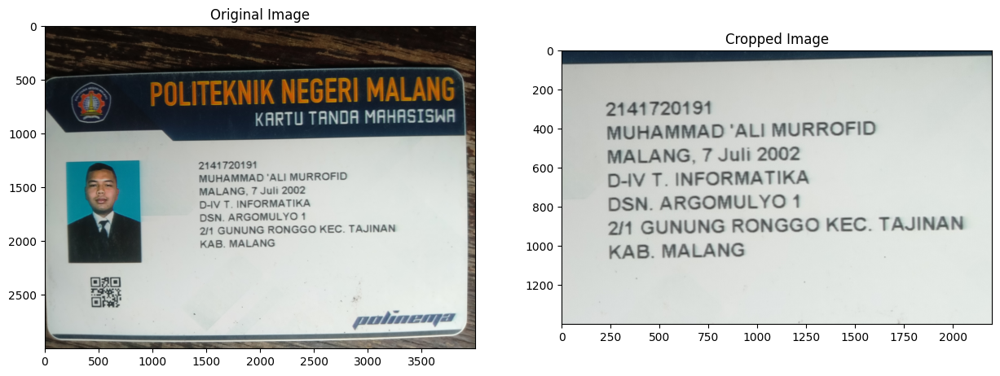

In [ ]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt

def image_rgb(path):
    # Konversi warna BGR ke RGB
    image = cv2.imread(path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return image_rgb

def crop_image(image, crop_box):
    # Lakukan cropping menggunakan slicing pada array NumPy
    cropped_image = image[crop_box[1]:crop_box[3], crop_box[0]:crop_box[2]]
    return cropped_image

path1 = '/content/drive/MyDrive/PCVK/Kelompok 10/3E_2141720191_1 - ali murrofid.jpg'
image1 = image_rgb(path1)

# Tentukan batas kotak yang akan di-crop (contoh: (left, top, right, bottom))
crop_box1 = (1200, 1000, 3400, 2400)
cropped_image1 = crop_image(image1, crop_box1)


# Menampilkan gambar yang telah di-crop
fig, axs = plt.subplots(1, 2, figsize=(15, 8))
axs[0].imshow(image1)
axs[0].set_title('Original Image')
# axs[0].axis('off')

axs[1].imshow(cropped_image1)
axs[1].set_title('Cropped Image')
# axs[1].axis('off')

plt.show()

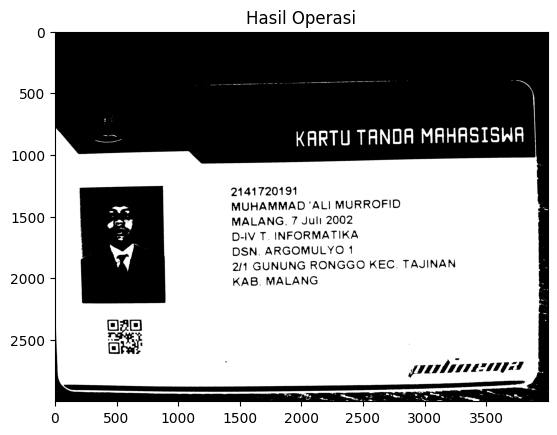

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def enhance_contrast_and_morphology(img, global_threshold_value, morph_kernel_size):
    # Konversi gambar ke skala abu-abu
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Peningkatan kontras dengan equalizeHist
    enhanced_image = cv2.equalizeHist(img_gray)

    # Lakukan thresholding global
    _, thresholded_image = cv2.threshold(enhanced_image, global_threshold_value, 255, cv2.THRESH_BINARY)
    # block_size = 15  # Adjust as needed
    # constant = 25     # Adjust as needed
    # thresholded_image = cv2.adaptiveThreshold(
    # img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, constant)
    # Thresholding
    # _, thresholded_image = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)


    # Buat kernel untuk operasi morfologi
    kernel = np.ones((morph_kernel_size, morph_kernel_size), np.uint8)

    # Lakukan operasi morfologi erosi
    morph_image = cv2.morphologyEx(thresholded_image, cv2.MORPH_ERODE, kernel)

    return morph_image

# Contoh penggunaan fungsi
global_threshold_value = 115
morph_kernel_size = 1

r_image = enhance_contrast_and_morphology(image1, global_threshold_value, morph_kernel_size)

# Tampilkan gambar hasil
plt.imshow(r_image, cmap='gray')
plt.title('Hasil Operasi')
# plt.axis('off')
plt.show()

In [ ]:
# img = cv2.imread(image1)
img = r_image
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# gray = cropped_image1

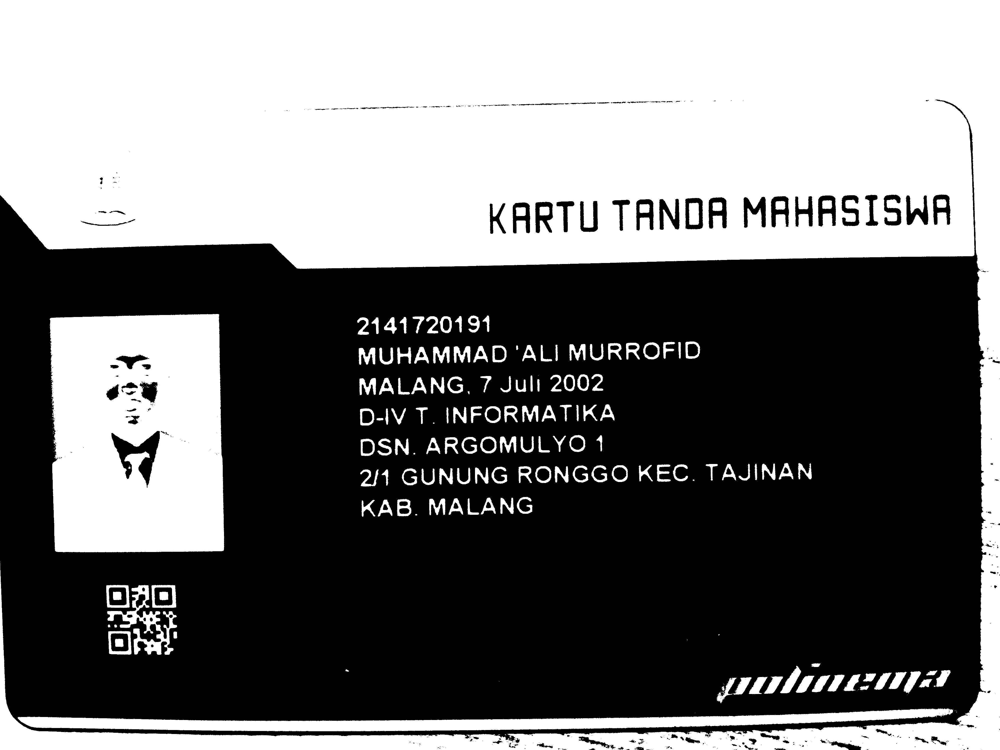

In [ ]:
# inverse image since we trained out model
# with black background
invertion = 255 - img
# check
cv2_imshow(invertion)

deteksi kontur

In [ ]:
# Define function for contour detection
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method='left-to-right')[0]

  return conts

In [ ]:
conts = find_contours(invertion.copy())

In [ ]:
# Check contour value
conts

(array([[[   0, 2256]],
 
        [[   0, 2262]]], dtype=int32),
 array([[[   0, 2251]],
 
        [[   0, 2254]]], dtype=int32),
 array([[[   0, 2246]],
 
        [[   0, 2247]]], dtype=int32),
 array([[[   0,    0]],
 
        [[   0,  779]],
 
        [[   2,  781]],
 
        ...,
 
        [[3997, 1445]],
 
        [[3999, 1445]],
 
        [[3999,    0]]], dtype=int32),
 array([[[3761, 2833]],
 
        [[3759, 2835]],
 
        [[3758, 2835]],
 
        ...,
 
        [[3763, 2835]],
 
        [[3762, 2835]],
 
        [[3761, 2834]]], dtype=int32),
 array([[[ 828, 1256]],
 
        [[ 827, 1257]],
 
        [[ 800, 1257]],
 
        ...,
 
        [[ 847, 1257]],
 
        [[ 831, 1257]],
 
        [[ 830, 1256]]], dtype=int32),
 array([[[ 200, 1369]],
 
        [[ 200, 1370]],
 
        [[ 201, 1369]]], dtype=int32),
 array([[[ 201, 1379]],
 
        [[ 201, 1382]]], dtype=int32),
 array([[[ 202, 1456]],
 
        [[ 202, 1457]]], dtype=int32),
 array([[[ 207, 1676]],
 
      

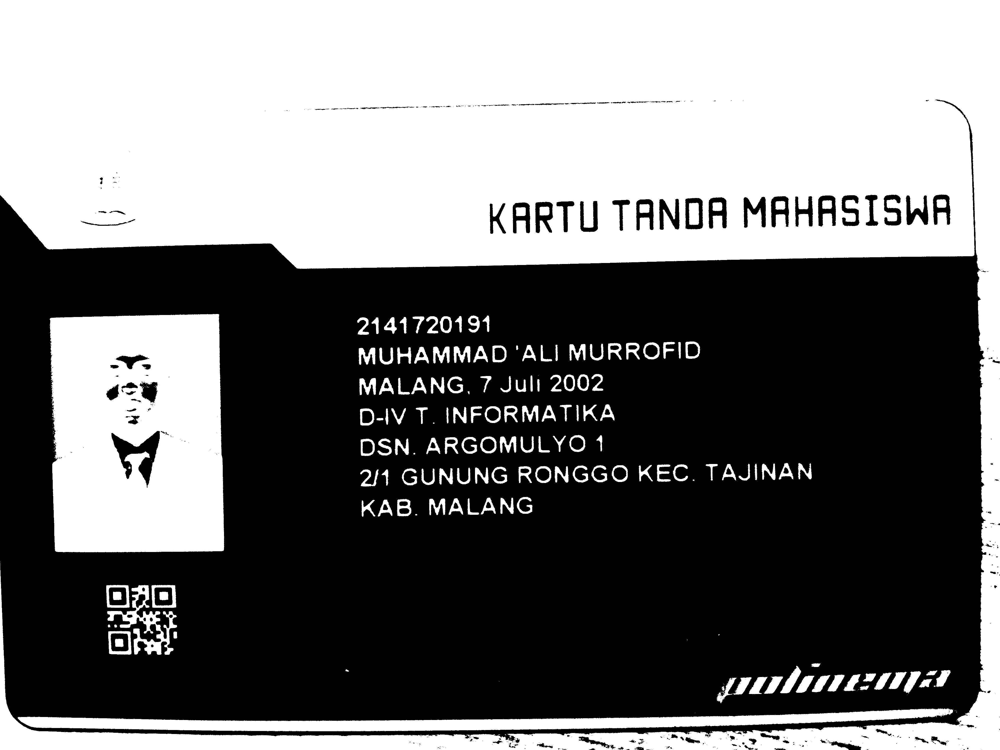

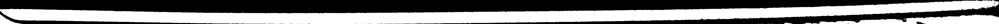

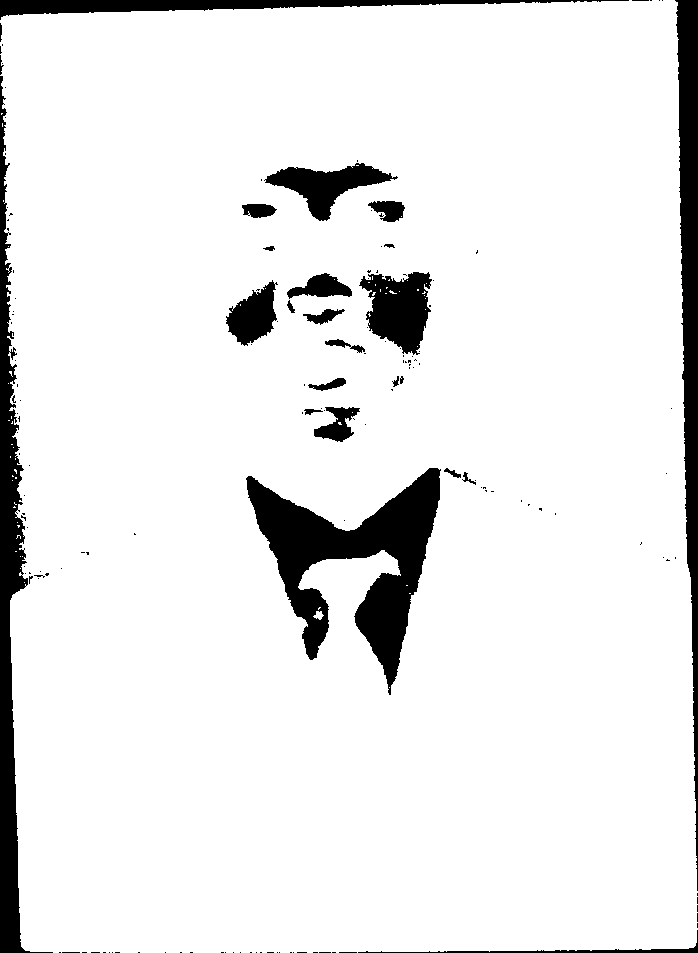

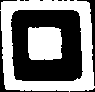

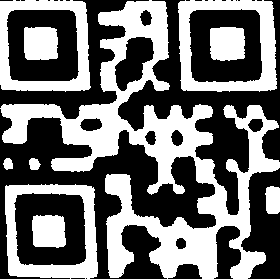

...

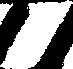

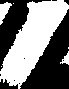

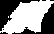

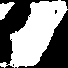

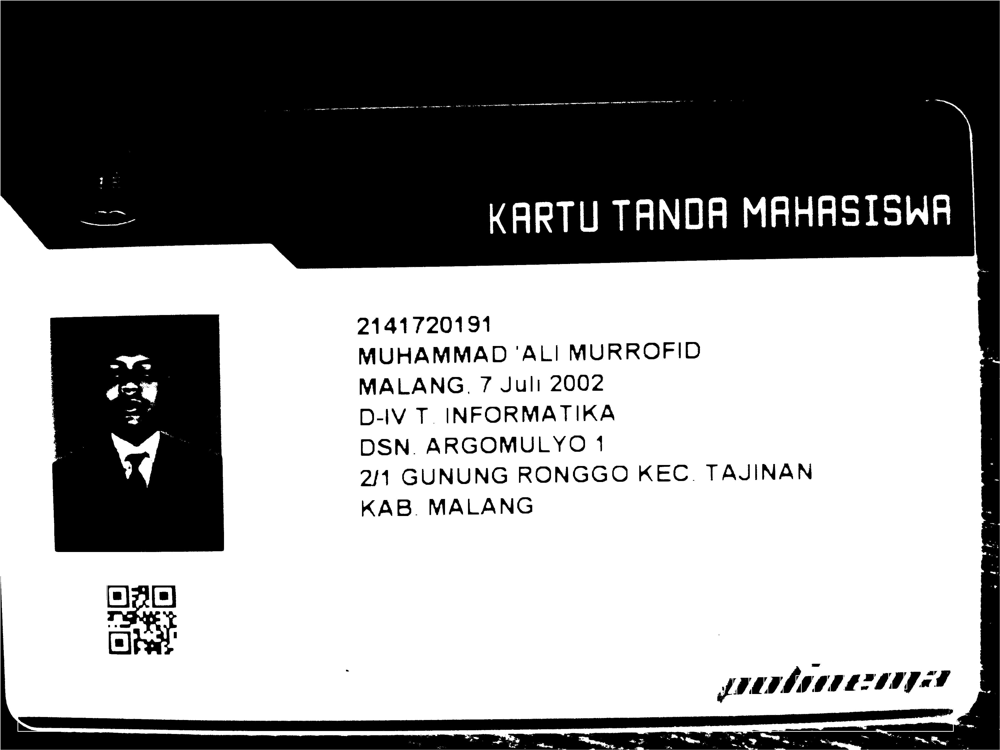

In [ ]:
# Get the char based on contour

# Setup min/max width/hight for char
min_w, max_w = 10, 180
min_h, max_h = 14, 180
img_copy = img.copy() # original image for plotting countour result

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
  # if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
  roi = img[y:y+h, x:x+w] # get region of interest for char
  thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  cv2_imshow(thresh) # check

  # Build bounding box on original image
  cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

# Show bounding box on original image
cv2_imshow(img_copy)

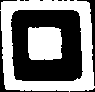

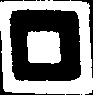

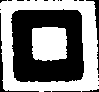

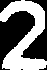

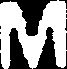

...

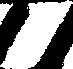

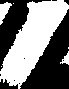

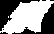

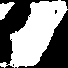

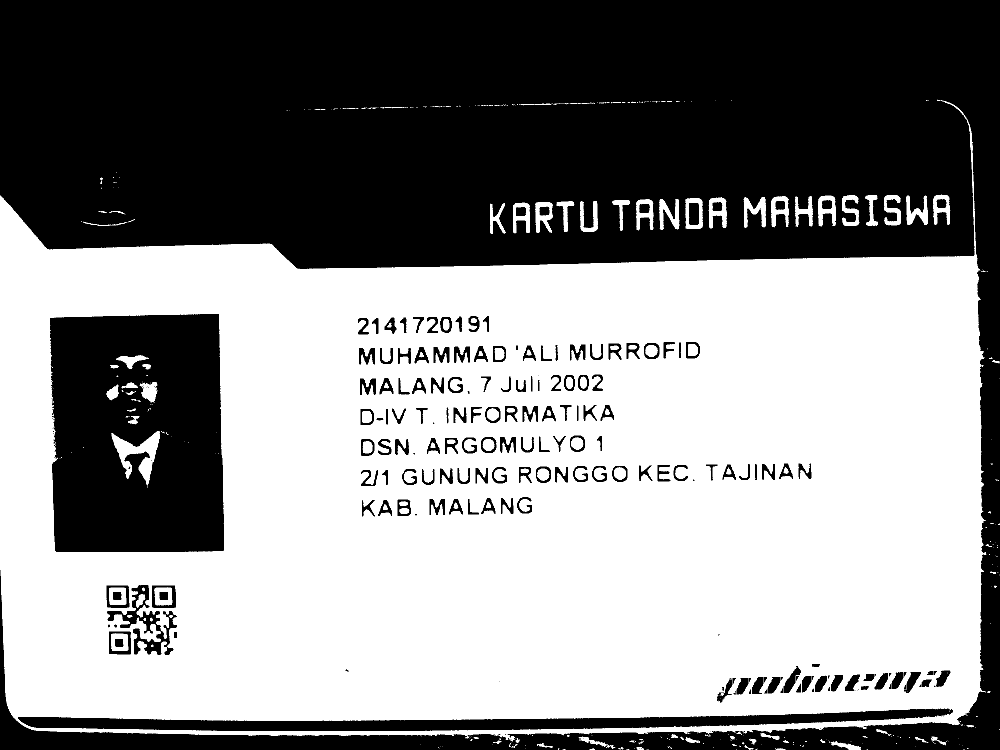

In [ ]:
# Get the char based on contour

# Setup min/max width/hight for char
min_w, max_w = 10, 180
min_h, max_h = 14, 180
img_copy = img.copy()

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
    roi = img[y:y+h, x:x+w] # get region of interest for char
    thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    cv2_imshow(thresh) # check

    # Build bounding box on original image
    cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

# Show bounding box on original image
cv2_imshow(img_copy)

### Detect

roi

In [ ]:
# Redefine roi --> include margin
def extract_roi(img, margin=2):
  roi = img[y - margin:y+h, x - margin:x + w + margin]
  return roi

def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  print(thresh)
  return thresh

resize

In [ ]:
def resize_img(img, w, h):
  if w > h:
    resized = imutils.resize(img, width=28)
  else:
    resized = imutils.resize(img, height=28)

  # (w, h) = resized.shape
  (h, w) = resized.shape

  # Calculate how many pixels need to fill char image
  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))
  filled = cv2.resize(filled, (28,28))

  return filled

enlarge

In [ ]:
# Demo for enlarge
(x, y, w, h) = cv2.boundingRect(conts[1])
test_image = thresholding(img[y:y+h, x:x+w])

# show original test image
cv2_imshow(test_image)

# Show enlarge test image
cv2_imshow(cv2.resize(test_image, (28,28)))

[[255]
 [255]
 [255]
 [255]]


In [ ]:
# Demo by filled strategy
# (w, h) = test_image.shape
(h, w) = test_image.shape

test_image2 = resize_img(test_image, w, h)

cv2_imshow(test_image)
cv2_imshow(test_image2)

Normalisasi

In [ ]:
def normalization(img):
  img = img.astype('float32') / 255.0 # convert to floating point
  img = np.expand_dims(img, axis=-1) # add depth
  return img

In [ ]:
# Check
test_image2.shape, normalization(test_image2).shape

((28, 28), (28, 28, 1))

### Detecettion

In [ ]:
def process_box(invertion, x, y, w, h):

  roi = extract_roi(invertion)
  # tresh = enhance_contrast_and_morphology(image1,thr_val,mk)
  (h, w) = roi.shape
  resized = resize_img(roi, w, h)

  # show result
  cv2_imshow(resized)

  normalized = normalization(resized)

  return (normalized, (x, y, w, h))

In [ ]:
# Detect every single char from contour
detected_char = []

for c in conts:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 10, 200
  min_h, max_h = 14, 180

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char.append(process_box(invertion, x, y, w, h))

In [ ]:
# check pixel for detected char sample
detected_char[0][0]

array([[[0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.        ],
        [0.09803922],
        [0.16862746],
        [0.16862746],
        [0.16862746],
        [0.34509805],
        [0.23137255],
        [0.24705882],
        [0.23529412],
        [0.44705883],
        [0.44705883],
        [0.4117647 ],
        [0.24705882],
        [0.44705883],
        [0.44705883],
        [0.2901961 ],
        [0.4392157 ],
        

In [ ]:
# check bounding box for detected char sample
detected_char[0][1]

(424, 2340, 99, 94)

In [ ]:
# Get all char pixel
pixels = np.array([px[0] for px in detected_char], dtype='float32')

# Get all box for detected char
boxes = [box[1] for box in detected_char]

In [ ]:
pixels.shape

(126, 28, 28, 1)

Check

In [ ]:
digits = '0123456789'
letters = 'ABCDEFGHIJKLMNOPQRSTUVWZYZ'
char_list = digits + letters
char_list = [ch for ch in char_list]

print(char_list)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'Z', 'Y', 'Z']


In [ ]:
# Predict
preds = model.predict(pixels)
preds.shape

4/4 [==============================] - 0s 15ms/step


(126, 36)

In [ ]:
# Char Prediction
for p in preds:
  char_idx = np.argmax(p)
  print(char_list[char_idx], end = " ")

B G B B 2 M N D 2 D K 1 S A A U 1 4 1 V N B H L 9 G A 7 A T U A 2 N N N N O R G A N N 1 U G L 9 F A N 0 7 A 1 0 G D N N J R U G R U N A 1 0 1 L L A 2 Y N T 0 0 N G 1 0 K U G 2 9 A R 0 R K 0 E F C 1 D T 4 8 A N J U 1 N N A U 0 N D U B 4 M N N N N H N B 

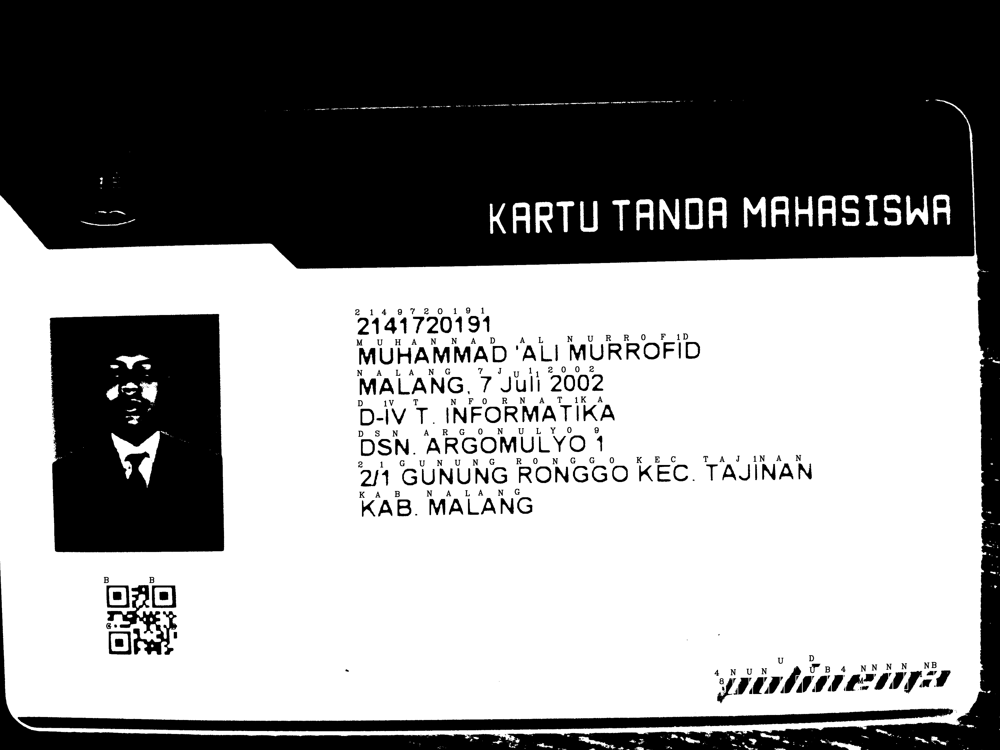

In [ ]:
# Show char with actual image
img_copy2 = img.copy()

for(pred, (x, y, w, h)) in zip(preds, boxes):
  i = np.argmax(pred)
  char_detected = char_list[i]

  cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 2)
  cv2.putText(img_copy2, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 2)

cv2_imshow(img_copy2)

## Bikin Fungsi Biar Jalan

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
model_path = '/content/model.h5'
model = load_model(model_path)


In [ ]:
def predict(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  # blur = cv2.GaussianBlur(gray, (3,3), 0)
  # adaptive = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 1)
  enhanced_image = cv2.equalizeHist(gray)
  _, thresholded = cv2.threshold(enhanced_image, 115, 255, cv2.THRESH_BINARY)

  kernel = np.ones((1, 1), np.uint8)
  erode = cv2.morphologyEx(thresholded, cv2.MORPH_ERODE, kernel)
  invertion = 255 - erode
  # erode = cv2.erode(invertion, np.ones((1,1)))

  cv2_imshow(invertion)

  conts = find_contours(invertion.copy())

  min_w, max_w = 10, 180
  min_h, max_h = 14, 180
  img_copy = image.copy() # original image for plotting countour result
  filtered_conts = []
  detected_char = []

  for c in conts:
    (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
    if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
      filtered_conts.append(c)
      roi = gray[y:y+h, x:x+w] # get region of interest for char
      thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
      # cv2_imshow(thresh) # check

      # Build bounding box on original image
      cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)
      (h, w) = thresh.shape
      resized = resize_img(thresh, w, h)
      normalized = normalization(resized)
      detected_char.append((normalized, (x, y, w, h)))


  pixels = np.array([px[0] for px in detected_char], dtype='float32')

  # Get all box for detected char
  boxes = [box[1] for box in detected_char]

  # Predict
  preds = model.predict(pixels)

  # Char Prediction
  for p in preds:
    char_idx = np.argmax(p)

  # Show char with actual image
  img_copy2 = image.copy()

  for(pred, (x, y, w, h)) in zip(preds, boxes):
    i = np.argmax(pred)
    char_detected = char_list[i]

    cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 2)
    cv2.putText(img_copy2, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 2)

  return img_copy2

In [ ]:
def predict(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    enhanced_image = cv2.equalizeHist(gray)
    _, thresholded = cv2.threshold(enhanced_image, 115, 255, cv2.THRESH_BINARY)

    kernel = np.ones((1, 1), np.uint8)
    erode = cv2.morphologyEx(thresholded, cv2.MORPH_ERODE, kernel)
    invertion = 255 - erode

    cv2_imshow(invertion)

    conts = find_contours(invertion.copy())

    min_w, max_w = 8, 180
    min_h, max_h = 14, 160
    img_copy = image.copy()  # original image for plotting contour result
    filtered_conts = []
    detected_char = []
    recognized_text = ""
    char_positions = []  # List untuk menyimpan posisi horizontal huruf

    for c in conts:
        (x, y, w, h) = cv2.boundingRect(c)
        if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
            filtered_conts.append(c)
            roi = gray[y:y + h, x:x + w]
            thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

            cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255, 0, 0), 2)
            (h, w) = thresh.shape
            resized = resize_img(thresh, w, h)
            normalized = normalization(resized)
            detected_char.append((normalized, (x, y, w, h)))
            char_positions.append(x)  # Simpan posisi horizontal huruf

    pixels = np.array([px[0] for px in detected_char], dtype='float32')
    boxes = [box[1] for box in detected_char]

    # Urutkan huruf berdasarkan posisi horizontal
    sorted_indices = np.argsort(char_positions)
    sorted_detected_char = [detected_char[i] for i in sorted_indices]

    # Predict
    preds = model.predict(pixels)

    # Char Prediction
    for p, (x, y, w, h) in zip(preds, boxes):
        i = np.argmax(p)
        char_detected = char_list[i]
        recognized_text += char_detected

        cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255, 0, 0), 2)
        cv2.putText(img_copy, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0, 0, 255), 2)

    print("Recognized Text:", recognized_text)

    return img_copy


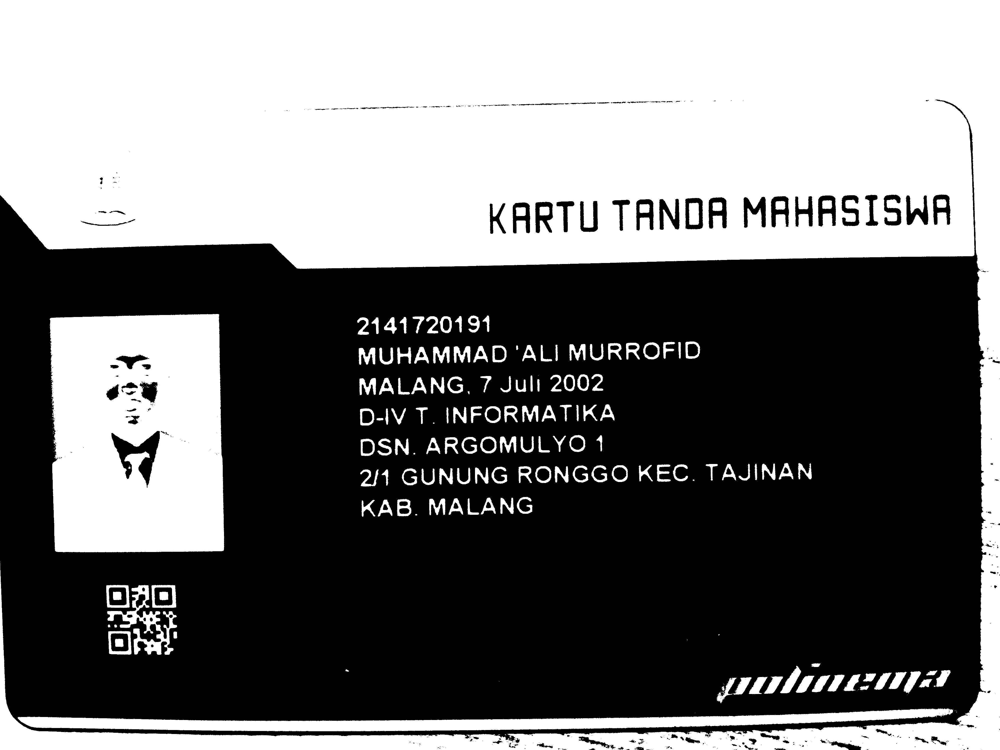

5/5 [==============================] - 0s 17ms/step
Recognized Text: BSSB2MND2DK4SAAUYQ1VNBHL1GATATUA2NNNN0R1GANN4UGL9FANUTA4UGDNNJRUTGRUNA1U1LLA2YN1TOUMG1OKUG29ARURKUEFC1DTHKABJU1NBAUUNDUUEDNNNUQOU


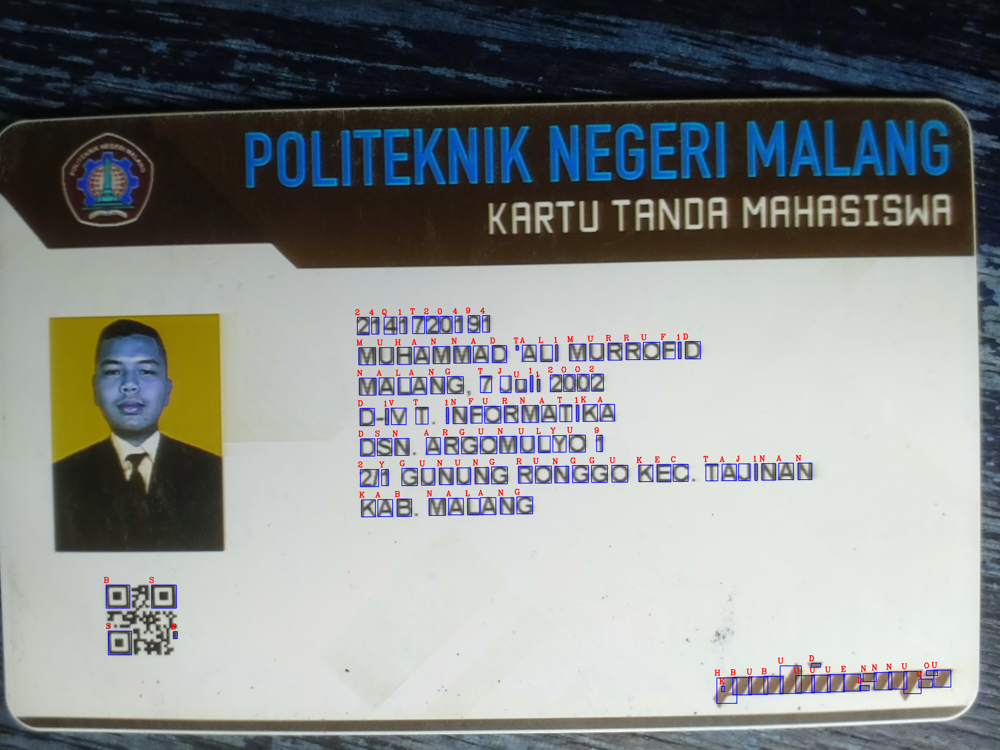

In [ ]:
cv2_imshow(predict(image1))